# Regresión logistica Multiple
En este cuaderno, exploraremos el concepto de regresión logistica y su aplicación práctica mediante un ejemplo en Python. Para comenzar, el primer paso consistirá en la descarga de datos y comprender su contenido. 

## Contenido
1. [Descarga de datos](#1.-Descarga-de-datos)
2. [Exploración de datos](#2.-Exploración-de-datos)
3. [Preprocesamiento de datos](#3.-Preprocesamiento-de-datos)
4. [Modelo de regresión logistica](#4.-Modelo-de-regresión-logistica)
5. [Evaluación del modelo](#5.-Evaluación-del-modelo)
6. [Conclusión](#6.-Conclusión)

## 1. Descarga de datos
El conjunto de datos que utilizaremos en este cuaderno se llama "Social_Network_Ads.csv". Este conjunto de datos contiene información sobre los usuarios de una red social y si compraron un producto en particular o no. Puede descargar el conjunto de datos desde [aquí](https://drive.google.com/file/d/1Z1J2QeJvzQ0gX1Zz9J1v7J1Zz9J1v7J/view?usp=sharing).



## Importa las librerias necesarias

In [23]:
# Manipulación de datos
import numpy as np
import pandas as pd
# Visualización
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
sns.set_theme(style='whitegrid', context='notebook')

# Modelos
## Preparar datos
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
## Regresión logistica
from sklearn.linear_model import LogisticRegression

# desbalance
from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler, SMOTENC
from imblearn.under_sampling import RandomUnderSampler, NearMiss
## Evaluación
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, ConfusionMatrixDisplay

# evita warnings
import warnings
warnings.filterwarnings('ignore')


Lins para mas información:

- [Regresión logistica](https://es.wikipedia.org/wiki/Regresi%C3%B3n_log%C3%ADstica)
- [Regresión logistica en Python](https://www.datacamp.com/community/tutorials/understanding-logistic-regression-python)
- [Comparison of multinomial logistic L1 vs one-versus-rest L1 logistic regression ](https://scikit-learn.org/stable/auto_examples/linear_model/plot_sparse_logistic_regression_20newsgroups.html#sphx-glr-auto-examples-linear-model-plot-sparse-logistic-regression-20newsgroups-py)
- [Umbalanced](https://imbalanced-learn.org/stable/over_sampling.html)
- [Parametros Regresión logistica Scikit-learn](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html#sklearn-linear-model-logisticregression)

## Importando datos
en este caso se toman los datos del modulo de Kaggle, Dry bean dataset, que contiene 16 clases de frijoles secos, con 7 atributos de forma y 1 atributo de textura.
https://www.kaggle.com/datasets/sansuthi/dry-bean-dataset 

In [24]:
# Cargar datos dry beans
data = pd.read_csv('datasets\Dry_Bean.csv')
data.head()


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


## 2. Exploración de datos

- Area (A): The area of a bean zone and the number of pixels within its boundaries.
- Perimeter (P): Bean circumference is defined as the length of its border.
- Major axis length (L): The distance between the ends of the longest line that can be drawn from a bean.
- Minor axis length (l): The longest line that can be drawn from the bean while standing perpendicular to the main axis.
- Aspect ratio (K): Defines the relationship between L and l.
- Eccentricity (Ec): Eccentricity of the ellipse having the same moments as the region.
- Convex area (C): Number of pixels in the smallest convex polygon that can contain the area of a bean seed.
- Equivalent diameter (Ed): The diameter of a circle having the same area as a bean seed area.
- Extent (Ex): The ratio of the pixels in the bounding box to the bean area.
- Solidity (S): Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.
- Roundness (R): Calculated with the following formula: (4piA)/(P^2)
- Compactness (CO): Measures the roundness of an object: Ed/L
- ShapeFactor1 (SF1)
ShapeFactor2 (SF2)
ShapeFactor3 (SF3)
ShapeFactor4 (SF4)
- Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)

In [25]:
data.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [26]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [27]:
# Verificar valores unicos
data['Class'].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

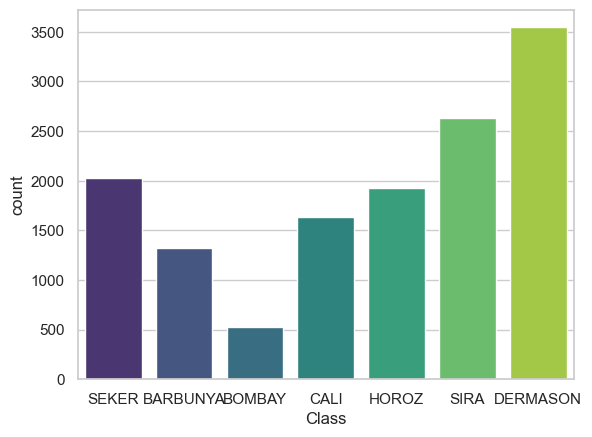

In [28]:
# Visualización de target "Class"
sns.countplot(x='Class', data=data, palette='viridis')
plt.show()


In [29]:
#des balanceado

# Preparando los datos  

Dentros del Preprocesamiento de los datos se debe de asegurar:

- Eliminar duplicados
- Evaluar nulos
- Evaluar Undersampling o Oversampling
- Remover columnas innecesarias(codigo, id, etc)
- Remover outliers
- Normalizar  o Estandarizar o Escalar los datos
- Crear variables dummy
- Crear variables polinomiales

In [30]:
# ver nulos
data.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [31]:
# eliminar duplicados
data_sin_duplicados = data.copy()
data_sin_duplicados.drop_duplicates(inplace=True)

### UnderSampling

In [32]:
## aplicar random under sampler para balancear
rus = RandomUnderSampler(random_state=23)



In [33]:
X = data_sin_duplicados.drop('Class', axis=1)
y = data_sin_duplicados['Class']


In [34]:
X_res, y_res = rus.fit_resample(X, y)
 

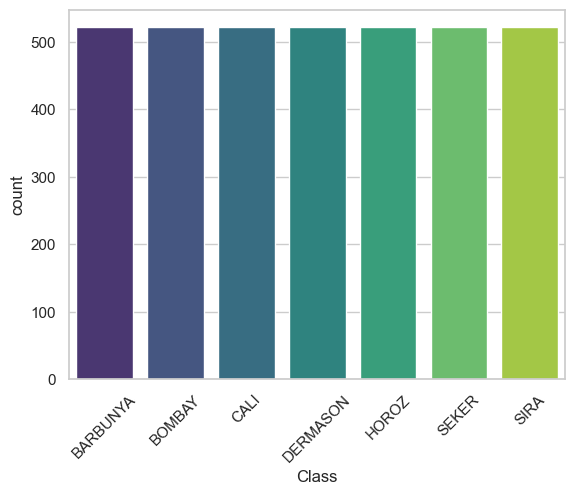

In [35]:
# Visualizar target balanceado
sns.countplot(x=y_res, palette='viridis')
plt.xticks(rotation=45)
plt.show()


In [36]:
data.shape, X_res.shape

((13611, 17), (3654, 16))

In [37]:
# nombres de clases
nombres_clases = data['Class'].unique()
print(nombres_clases)


['SEKER' 'BARBUNYA' 'BOMBAY' 'CALI' 'HOROZ' 'SIRA' 'DERMASON']


In [38]:
# convertir class a numerico con replace en  y_res
y_res = y_res.replace({'SEKER': 0, 'BARBUNYA': 1, 'BOMBAY': 2, 'CALI': 3, 'HOROZ': 4, 'SIRA': 5, 'DERMASON': 6})

y_res.value_counts()

Class
1    522
2    522
3    522
6    522
4    522
0    522
5    522
Name: count, dtype: int64

In [39]:
# verificar outliers

# Análisis Exploratorio de Datos

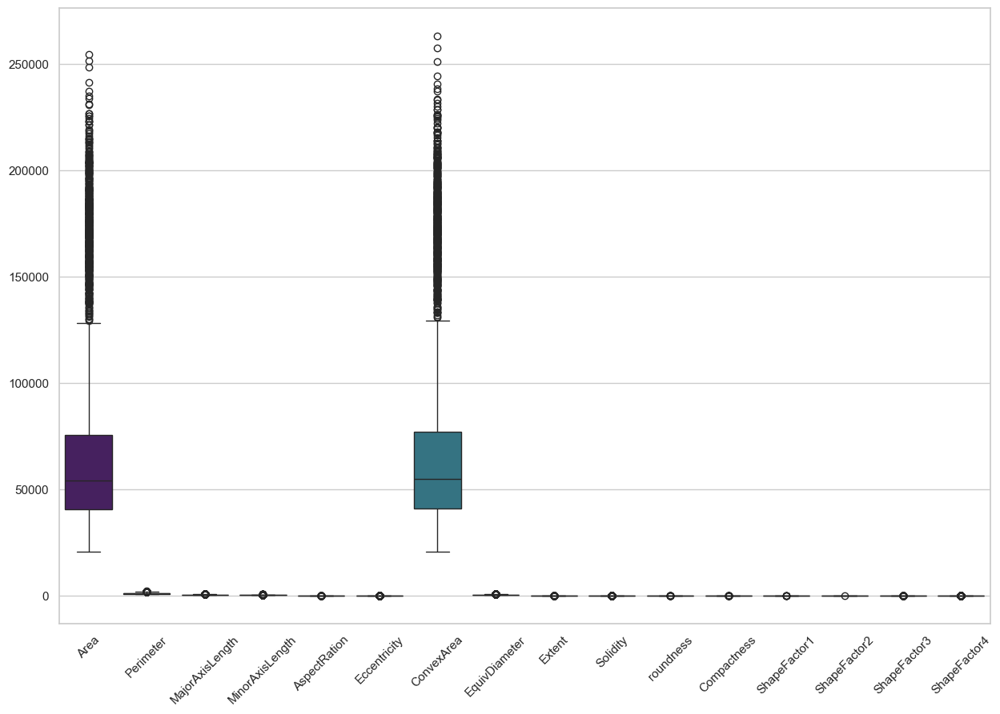

In [40]:
# Visualización de outliers
plt.figure(figsize=(15, 10))
sns.boxplot(data=X_res, palette='viridis')
plt.xticks(rotation=45)
plt.show()

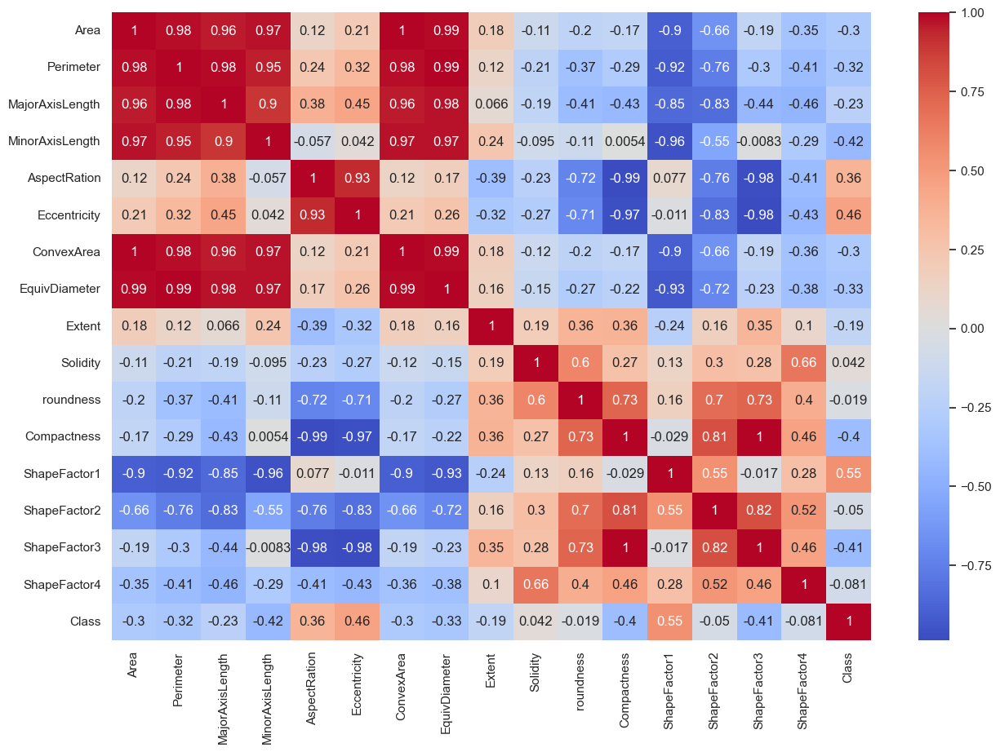

In [41]:
# ver correlaciones entre variables
df_final = X_res.copy()
df_final['Class'] = y_res.copy( )
# Correlación entre variables
corr = df_final.corr()

plt.figure(figsize=(15, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()


In [20]:
## Eliminar variables correlacionadas con un umbral de 0.9
umbral = 0.9
corr_matrix = X_res.corr().abs()
#upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1))
#to_drop = [column for column in upper.columns if any(upper[column] > umbral)]
#to_drop
#X_res = X_res.drop(to_drop, axis=1)

In [21]:
df_final.drop(['ConvexArea', 'EquivDiameter', 'Perimeter','MajorAxisLength','MinorAxisLength'], axis=1, inplace=True)

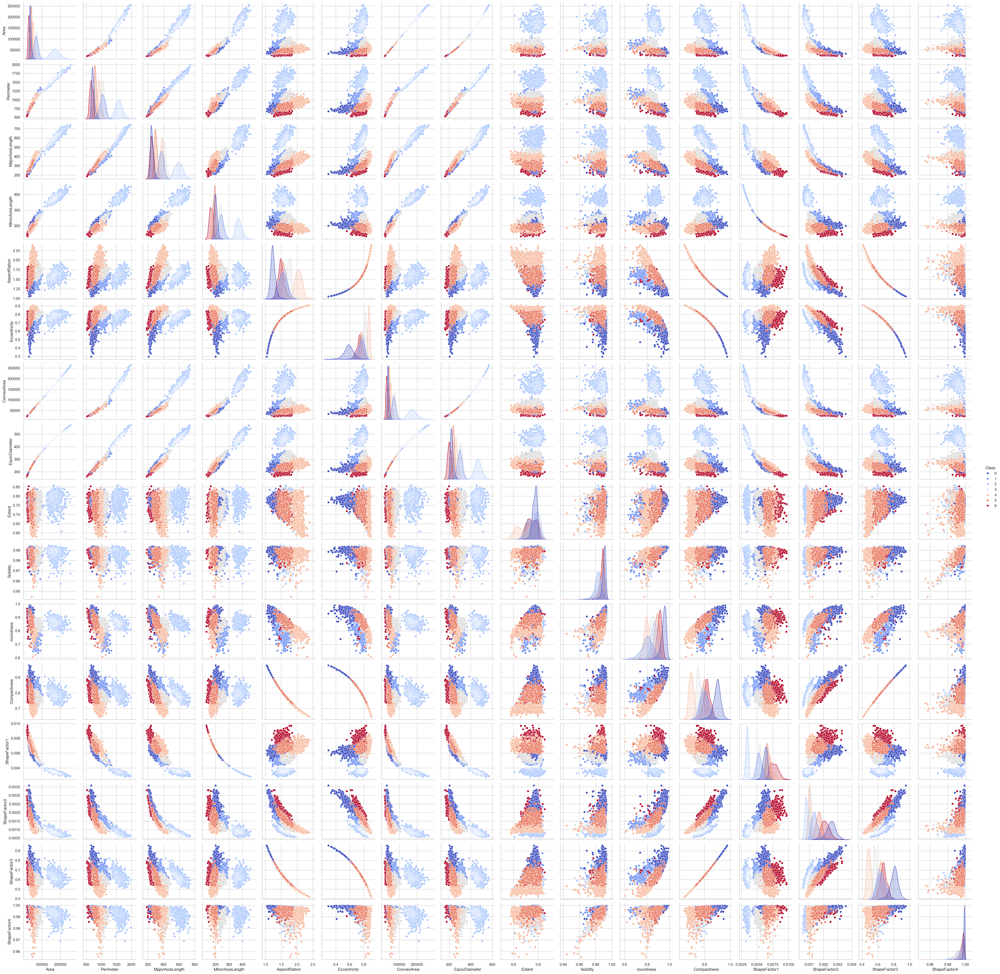

In [42]:
# pairplot
sns.pairplot(data=df_final,hue='Class',palette='coolwarm')


### Split y Escalado

In [45]:
X_final = df_final.drop('Class', axis=1)
y_final = df_final['Class']
X_train, X_test, y_train, y_test = train_test_split(X_final, y_final, test_size=0.2, random_state=23)
# estandarizar
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)



# Modelado

Vamos a entrenar varios modeelos de clasificación para ver cual es el mejor, compararemos one vs rest y multinomial

‘sag’ and ‘saga’ fast convergence is only guaranteed on features with approximately the same scale.

In [46]:
# definir funcion para ajustar modelo de regresion logistica
def ajustar_modelo_logistico(C_,solver_, multiclass_):
    # Ajustar modelo
    model = LogisticRegression(C=C_, solver=solver_, multi_class=multiclass_,random_state=23,n_jobs=-1)
    
    return model

solver{‘lbfgs’, ‘liblinear’, ‘newton-cg’, ‘newton-cholesky’, ‘sag’, ‘saga’}, default=’lbfgs’
Algorithm to use in the optimization problem. Default is ‘lbfgs’. To choose a solver, you might want to consider the following aspects:

For small datasets, ‘liblinear’ is a good choice, whereas ‘sag’ and ‘saga’ are faster for large ones;

For multiclass problems, only ‘newton-cg’, ‘sag’, ‘saga’ and ‘lbfgs’ handle multinomial loss;

‘liblinear’ is limited to one-versus-rest schemes.

‘newton-cholesky’ is a good choice for n_samples >> n_features, especially with one-hot encoded categorical features with rare categories. Note that it is limited to binary classification and the one-versus-rest reduction for multiclass classification. Be aware that the memory usage of this solver has a quadratic dependency on n_features because it explicitly computes the Hessian matrix.

In [47]:
# ejemplo de la funcion
model = ajustar_modelo_logistico(1.0, 'saga', 'multinomial')
model.fit(X_train, y_train)
predicciones = model.predict(X_test)
print('Accuracy:', accuracy_score(y_test, predicciones))
print('Matriz de confusión:\n', confusion_matrix(y_test, predicciones))


Accuracy: 0.9316005471956225
Matriz de confusión:
 [[102   1   0   0   0   2   0]
 [  2  97   0   8   0   1   0]
 [  0   0 109   0   0   0   0]
 [  0   2   0  99   2   0   0]
 [  0   0   0   1 101   2   0]
 [  2   0   0   0   1  85   9]
 [  1   0   0   0   1  15  88]]


*n_jobsint* + , default=None
Number of CPU cores used when parallelizing over classes if multi_class=’ovr’”. This parameter is ignored when the solver is set to ‘liblinear’ regardless of whether ‘multi_class’ is specified or not. None means 1 unless in a joblib.parallel_backend context. -1 means using all processors

This parameter is used to specify how many concurrent processes or threads should be used for routines that are parallelized with joblib.

n_jobs is an integer, specifying the maximum number of concurrently running workers. If 1 is given, no joblib parallelism is used at all, which is useful for debugging. If set to -1, all CPUs are used. For n_jobs below -1, (n_cpus + 1 + n_jobs) are used. For example with n_jobs=-2, all CPUs but one are used.



In [52]:
# definir lista de hiperparametros
multi_class = ['ovr', 'multinomial']
solvers = ['liblinear','newton-cg', 'lbfgs', 'sag', 'saga']
scores = []
params = []

for multi in multi_class:
    for solver in solvers:
        try:
            model = ajustar_modelo_logistico(1.0, solver, multi)
            model.fit(X_train, y_train)
            predicciones = model.predict(X_test)
            score = accuracy_score(y_test, predicciones)
            scores.append(score)
            params.append(f"{multi} + {solver}")
            print(f'Multi_class: {multi}, Solver: {solver}, Accuracy: {score}')
        except:
            print(f'Multi_class: {multi}, Solver: {solver}, Error')
            continue
        


Multi_class: ovr, Solver: liblinear, Accuracy: 0.9179206566347469
Multi_class: ovr, Solver: newton-cg, Accuracy: 0.9192886456908345
Multi_class: ovr, Solver: lbfgs, Accuracy: 0.9192886456908345
Multi_class: ovr, Solver: sag, Accuracy: 0.9192886456908345
Multi_class: ovr, Solver: saga, Accuracy: 0.9192886456908345
Multi_class: multinomial, Solver: liblinear, Error
Multi_class: multinomial, Solver: newton-cg, Accuracy: 0.9316005471956225
Multi_class: multinomial, Solver: lbfgs, Accuracy: 0.9316005471956225
Multi_class: multinomial, Solver: sag, Accuracy: 0.9316005471956225
Multi_class: multinomial, Solver: saga, Accuracy: 0.9316005471956225


In [ ]:
#

In [49]:
# ajustar modelo con hiperparametros con GridSearch 

from sklearn.model_selection import GridSearchCV

param_grid = { 'solver': ['liblinear','newton-cg', 'lbfgs', 'sag', 'saga'],
                'multi_class': ['ovr', 'multinomial']}
model = LogisticRegression(random_state=23, C=1.0, n_jobs=-1)
grid = GridSearchCV(model, param_grid, cv=5)
grid.fit(X_train, y_train)
   

GridSearchCV(cv=5, estimator=LogisticRegression(n_jobs=-1, random_state=23),
             param_grid={'multi_class': ['ovr', 'multinomial'],
                         'solver': ['liblinear', 'newton-cg', 'lbfgs', 'sag',
                                    'saga']})

In [56]:
# ver mejor modelo y su score GridSearch
print(grid.best_estimator_)
print(grid.best_score_)
print(grid.best_params_)


LogisticRegression(multi_class='multinomial', n_jobs=-1, random_state=23)
0.93056023884791
{'multi_class': 'multinomial', 'solver': 'lbfgs'}


## Análisis de resultados

In [53]:
params

['ovr + liblinear',
 'ovr + newton-cg',
 'ovr + lbfgs',
 'ovr + sag',
 'ovr + saga',
 'multinomial + newton-cg',
 'multinomial + lbfgs',
 'multinomial + sag',
 'multinomial + saga']

([0, 1, 2, 3, 4, 5, 6, 7, 8],
 [Text(0, 0, 'ovr + liblinear'),
  Text(1, 0, 'ovr + newton-cg'),
  Text(2, 0, 'ovr + lbfgs'),
  Text(3, 0, 'ovr + sag'),
  Text(4, 0, 'ovr + saga'),
  Text(5, 0, 'multinomial + newton-cg'),
  Text(6, 0, 'multinomial + lbfgs'),
  Text(7, 0, 'multinomial + sag'),
  Text(8, 0, 'multinomial + saga')])

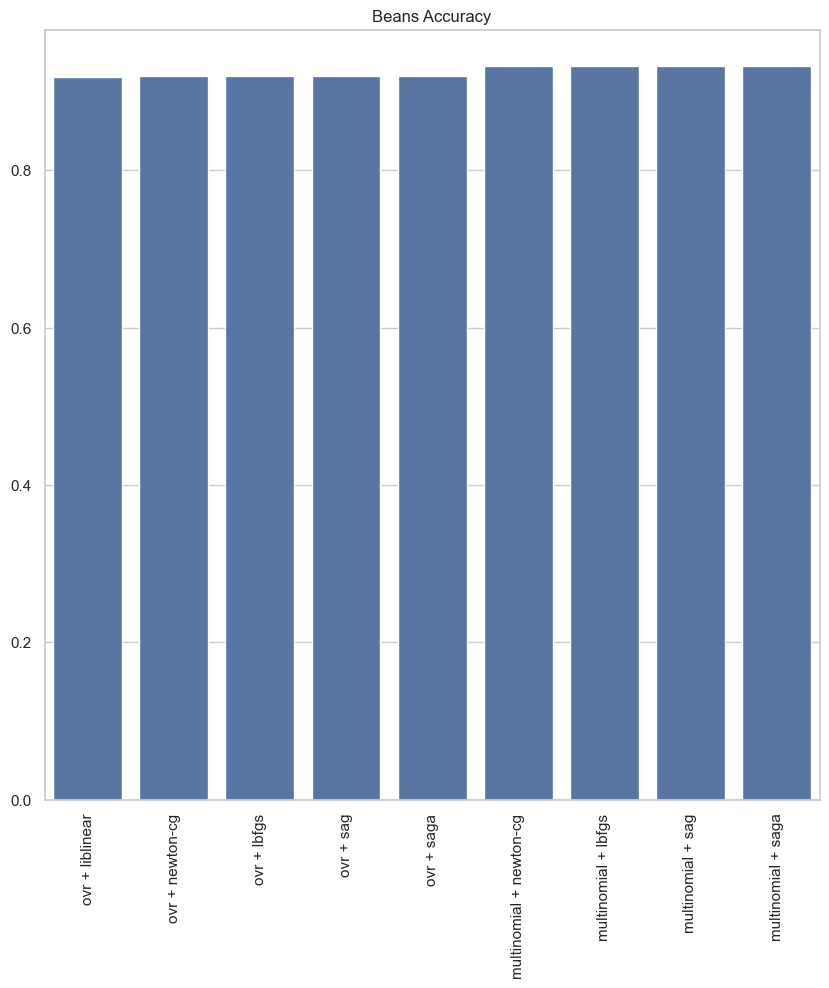

In [54]:
fig = plt.figure(figsize=(10,10))
sns.barplot(x=params, y=scores).set_title('Beans Accuracy')
plt.xticks(rotation=90)

In [55]:
# print best parameter in scores list 
print(f'Best parameters: {params[scores.index(max(scores))]}')
print(f'Best score: {max(scores)}')


Best parameters: multinomial + newton-cg
Best score: 0.9316005471956225


In [57]:
# entrenar modelo con mejores hiperparametros multiclass='multinomial ', solver='newton-cg'
model = ajustar_modelo_logistico(1.0, 'newton-cg', 'multinomial')
model.fit(X_train, y_train)
predicciones = model.predict(X_test)
print('Accuracy:', accuracy_score(y_test, predicciones))
print('Matriz de confusión:\n', confusion_matrix(y_test, predicciones))
print('Classification Report:\n', classification_report(y_test, predicciones))


Accuracy: 0.9316005471956225
Matriz de confusión:
 [[102   1   0   0   0   2   0]
 [  2  97   0   8   0   1   0]
 [  0   0 109   0   0   0   0]
 [  0   2   0  99   2   0   0]
 [  0   0   0   1 101   2   0]
 [  2   0   0   0   1  85   9]
 [  1   0   0   0   1  15  88]]
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96       105
           1       0.97      0.90      0.93       108
           2       1.00      1.00      1.00       109
           3       0.92      0.96      0.94       103
           4       0.96      0.97      0.97       104
           5       0.81      0.88      0.84        97
           6       0.91      0.84      0.87       105

    accuracy                           0.93       731
   macro avg       0.93      0.93      0.93       731
weighted avg       0.93      0.93      0.93       731



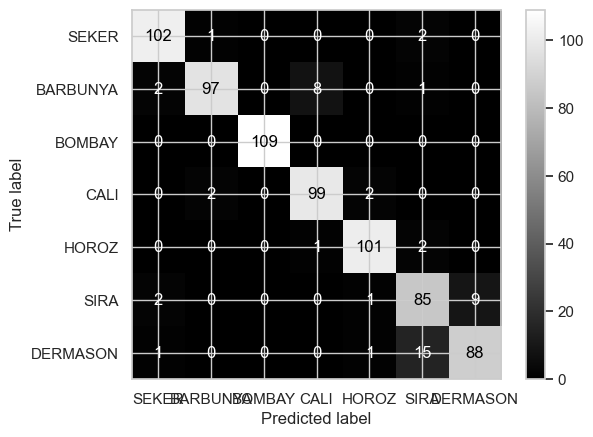

In [59]:
# visualizar matriz de confusion

cm = confusion_matrix(y_test, predicciones)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=nombres_clases)
disp.plot(cmap='gray')
plt.show()